In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib as mpl
import seaborn as sns
from matplotlib.patches import Circle
import matplotlib.tri as tri
import numpy as np
from scipy.spatial.transform import Rotation as R


beacon = pd.read_csv('beacons 20200128-151826.txt',sep=" ", header=None)
beacon2 = pd.read_csv('beacons 20200128-160013.txt',sep=" ", header=None)
Day86_fs2 = pd.read_csv('position 20200128-160013.txt',sep=" ", header=None)
Day86_fs1 = pd.read_csv('position 20200128-151826.txt',sep=" ", header=None)
Day72_fs1 = pd.read_csv('position 20191127-122008.txt',sep=" ", header=None)
Day72_fs2 = pd.read_csv('position 20191127-132223.txt',sep=" ", header=None)
beacon_time= beacon[0]

In [2]:
def rotation_correction(Day_fs1,Day_fs2,day):
    alpha = (5) * np.pi / 180
    Day_fs1x = Day_fs1[1] * np.cos(alpha) - Day_fs1[3] * np.sin(alpha)
    Day_fs1y = Day_fs1[1] * np.sin(alpha) + Day_fs1[3] * np.cos(alpha)
    Day_fs2x = Day_fs2[1] * np.cos(alpha) - Day_fs2[3] * np.sin(alpha)
    Day_fs2y = Day_fs2[1] * np.sin(alpha) + Day_fs2[3] * np.cos(alpha)
    
    fig,ax = plt.subplots(1,2,sharey=True,sharex=True)
    #fig.set_size_inches( 7.2/2,16.2/2)
    plt.xticks([])
    
    ax[0].hist2d(Day_fs1x,Day_fs1y,bins = 30,cmap='terrain',cmax=1000 )
    ax[0].plot(Day_fs1x,Day_fs1y,color='olive',alpha=.6)


    ax[1].hist2d(Day_fs2x,Day_fs2y,bins = 30,cmap='terrain',cmax=1000 )
    ax[1].plot(Day_fs2x,Day_fs2y,color='olive',alpha=.6)
    
    
    #ax[0].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
    #ax[1].add_patch(mpl.patches.Circle((-.3429, 0.2),.15,edgecolor='red', fill = False,linestyle='--',linewidth=2))
    ax[0].set_title('FS1', fontsize=10)
    ax[1].set_title('FS2', fontsize=10)
    ax[0].set_ylabel('Day %s ' %day)
    ax[0].set_xticks([])
    ax[1].set_xticks([])
    
    fig.dpi=200
    plt.tight_layout()
    plt.show()

### Try to look for specific runs based on the time given in txt file, but hard to automatize reading it and sampling it in about .01 sec neede to Sharey anshare z to see the full arena, :en or reco  

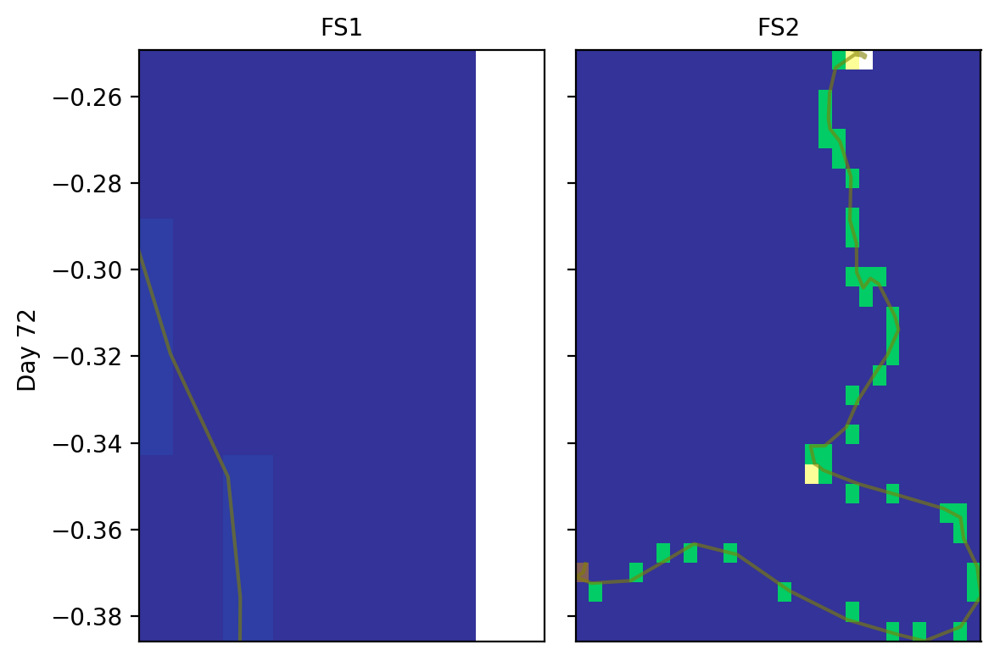

In [3]:
rotation_correction(Day72_fs1[5430:6480],Day72_fs2 [6430:6480],72)

### Day 72 is 5 minutes of baseline, 5 minutes of whitness and 20 minutes task session, hence if sampling rate it .01 and len - 32000

In [4]:
len(Day72_fs1)/30


1204.8

##### Hence each minute has 1200 samples - 

In [5]:
1200/60

20.0

#### Hence each second is 20 samples...  so if I want to get to the 10th minute - 1200*10 and 643 corresponds to seconds then if I want to find somethig in the 10:43 (min:sec) range I need to take the 643 * 20 sample - 648 * 20 sample 

In [6]:
1200*10

12000

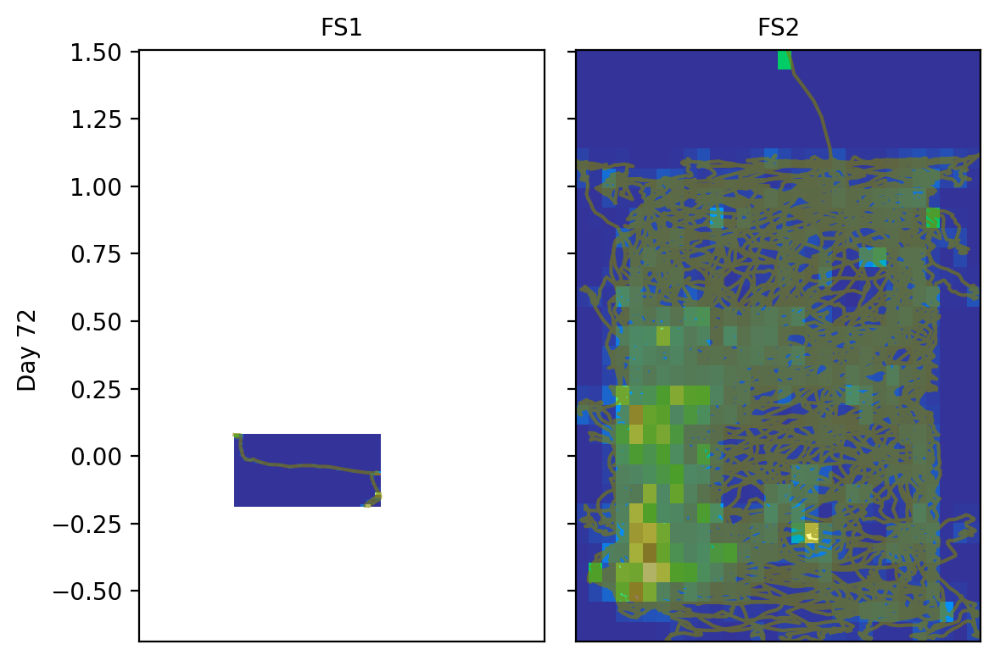

In [7]:
rotation_correction(Day72_fs2[640*20:648*20],Day72_fs2,72)

### 5 secoonds should equal 100 samples...  

### The next thiung to do would be to generate overlayed lines 3 seconds after and 3 seconds before the beacon was hit like in Bures... but with the 1.5 seconds . Yet of cource outbound would be slower becasue they have to turn out for dome sections of it... stil need to think about it. or at least they usualy wait there anyways. 

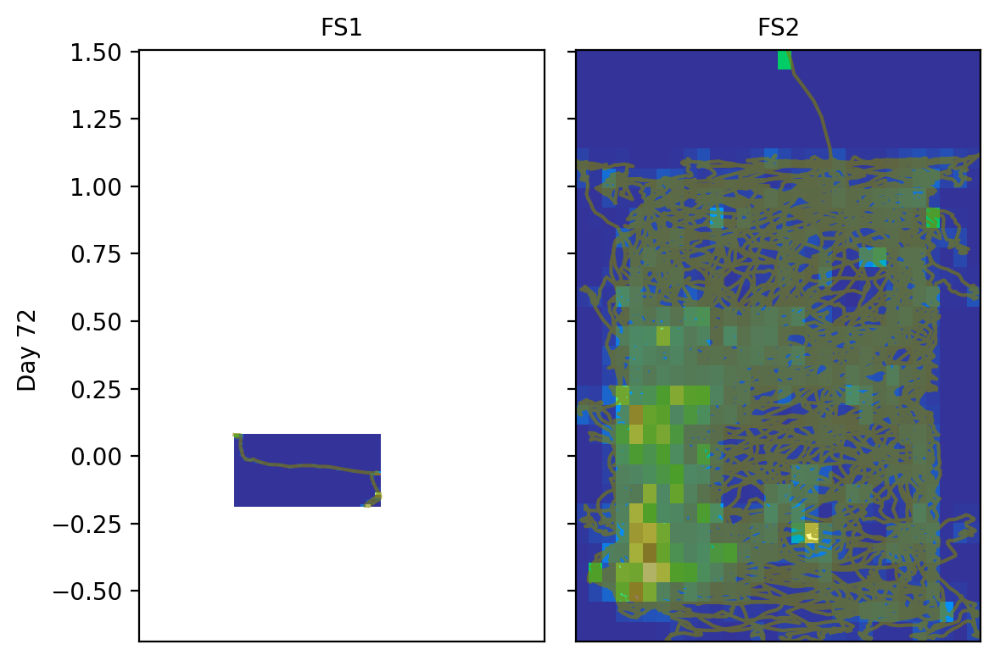

In [8]:
rotation_correction(Day72_fs2[640*20:648*20],Day72_fs2,72)

## Now need to write a script that takes as arguments beacon_time and Positions takes time from beacon_time- matches it with time from Day and then graphs the position 5 seconds before

In [9]:

#example from Andrey 
a = np.array([[1, 55],
              [2, 59],
              [3, 37],
              [4.5, 67],
              [4.8, 35],
              [5, 90]])

orig_time = 4.6
nearest_idx = np.abs(a[:, 0] - orig_time).argmin()
nearest = a[nearest_idx]
nearest
a

array([[ 1. , 55. ],
       [ 2. , 59. ],
       [ 3. , 37. ],
       [ 4.5, 67. ],
       [ 4.8, 35. ],
       [ 5. , 90. ]])

### Need ot convert all to array

### Times of beacon delivery. If every 1 second =  100 samples... then multiply seconds by hundred and get an index... ? as a workaround solution

In [10]:
a = np.array(Day86_fs2[0])
b = np.array(beacon_time)
print(a)
print(a[0]-b)

nearest_idx = np.abs(b[34]-a).argmin() 
nearest = a[nearest_idx]
nearest_idx
nearest

a[0]-b[1]
time_since=[]
for i in beacon_time:
    time_since= (a[0]-b)
time_since

import math
index = np.rint(time_since*10).astype(int)
print(len(index))
index

for i in index: 
    print (i)
    rotation_correction(Day86_fs1[i-650:i],Day86_fs2,86)

[1.58022368e+09 1.58022368e+09 1.58022368e+09 ... 1.58022559e+09
 1.58022559e+09 1.58022559e+09]
[2492.55999994 2411.75999999 2401.69999981 2373.51999998 2365.91999984
 2297.14999986 2289.72999978 2182.11999989 2114.6099999  2110.94999981
 1918.3599999  1887.48999977 1871.75999999 1867.07999992 1843.36999989
 1626.76999998 1616.12999988 1594.16999984 1480.4599998  1459.89999986
 1425.2099998  1416.3599999  1407.04999995 1262.30999994 1255.29999995
 1251.41999984 1216.80999994 1173.30999994 1153.66999984  938.97999978
  917.2099998   837.17999983  789.81999993  750.50999999  741.16999984]


In [11]:
nearest_idx = np.abs(b[34]-a).argmin() 
nearest = a[nearest_idx]
nearest_idx
nearest

1580223684.37

In [12]:
a[0]-b[1]
time_since=[]
for i in beacon_time:
    time_since= (a[0]-b)
time_since

array([2492.55999994, 2411.75999999, 2401.69999981, 2373.51999998,
       2365.91999984, 2297.14999986, 2289.72999978, 2182.11999989,
       2114.6099999 , 2110.94999981, 1918.3599999 , 1887.48999977,
       1871.75999999, 1867.07999992, 1843.36999989, 1626.76999998,
       1616.12999988, 1594.16999984, 1480.4599998 , 1459.89999986,
       1425.2099998 , 1416.3599999 , 1407.04999995, 1262.30999994,
       1255.29999995, 1251.41999984, 1216.80999994, 1173.30999994,
       1153.66999984,  938.97999978,  917.2099998 ,  837.17999983,
        789.81999993,  750.50999999,  741.16999984])

In [55]:
import math
index = np.rint(time_since*10).astype(int)
print(len(index))
index


35


array([24926, 24118, 24017, 23735, 23659, 22971, 22897, 21821, 21146,
       21109, 19184, 18875, 18718, 18671, 18434, 16268, 16161, 15942,
       14805, 14599, 14252, 14164, 14070, 12623, 12553, 12514, 12168,
       11733, 11537,  9390,  9172,  8372,  7898,  7505,  7412])

### so I want 6.5 seconds before the index. menaing 6500 data points 

## Generate a plot for 6.5 ssconds before every beacon award was given 

24926


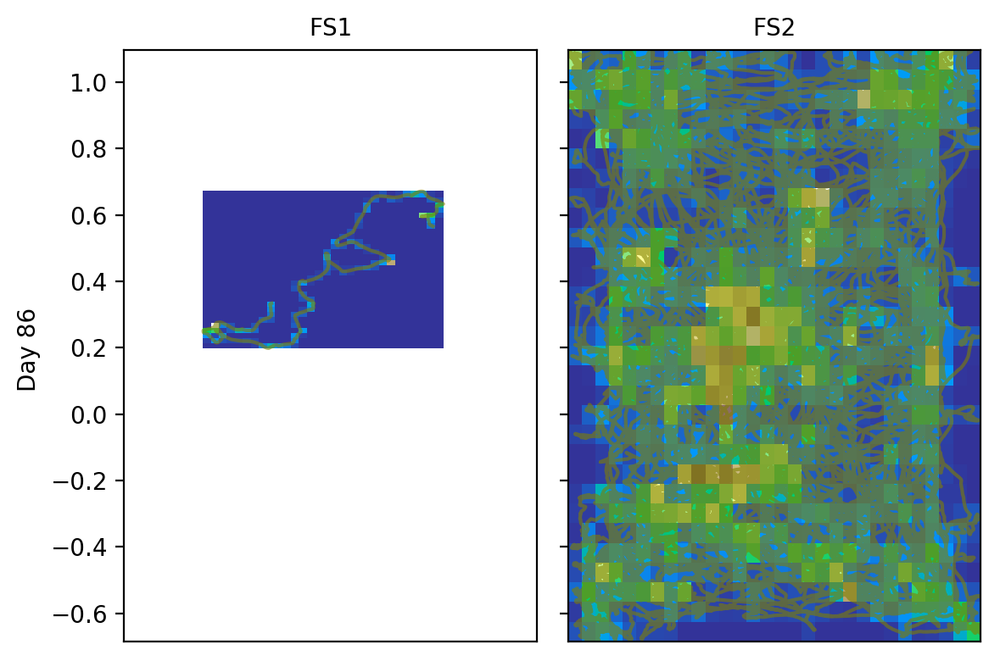

24118


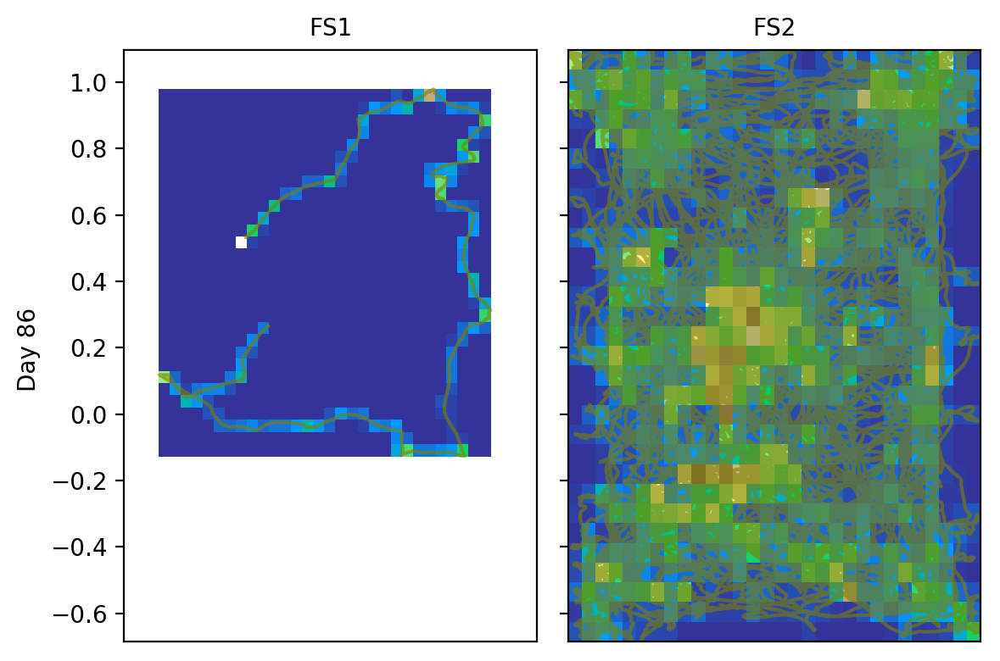

24017


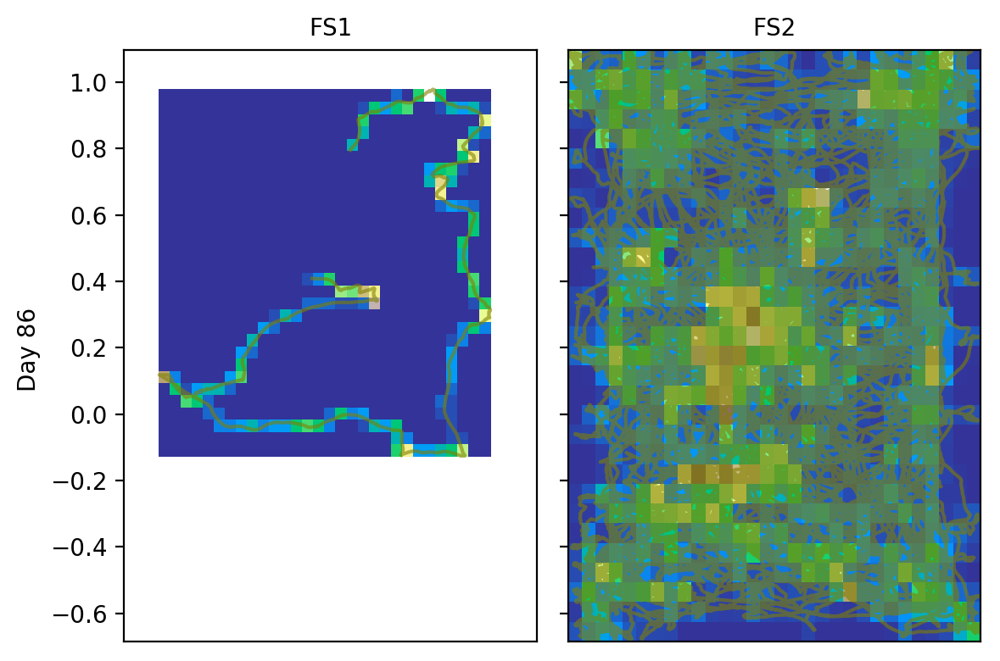

23735


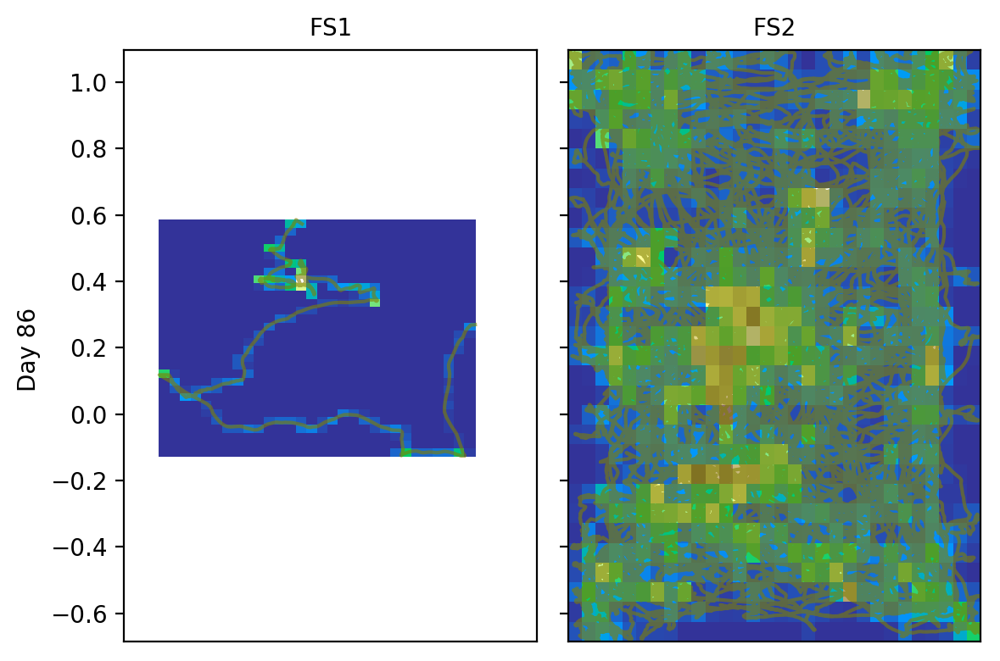

23659


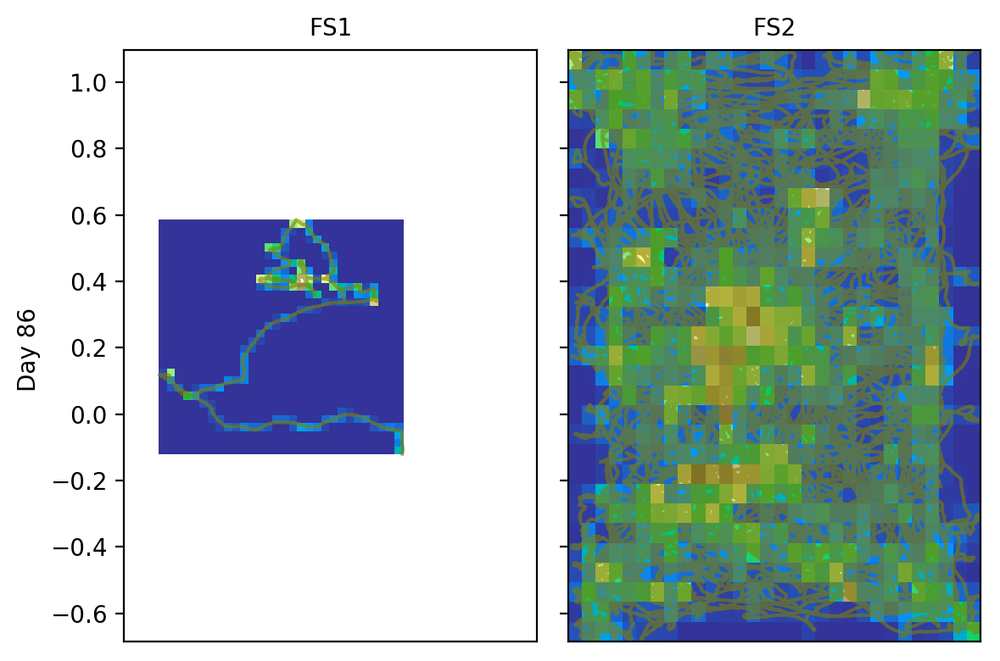

22971


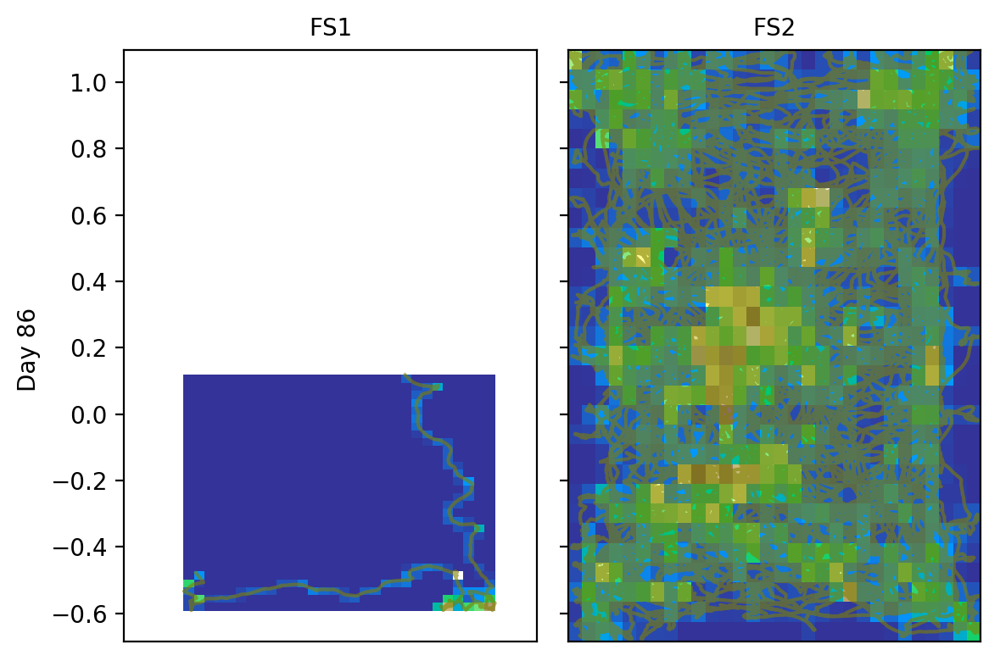

22897


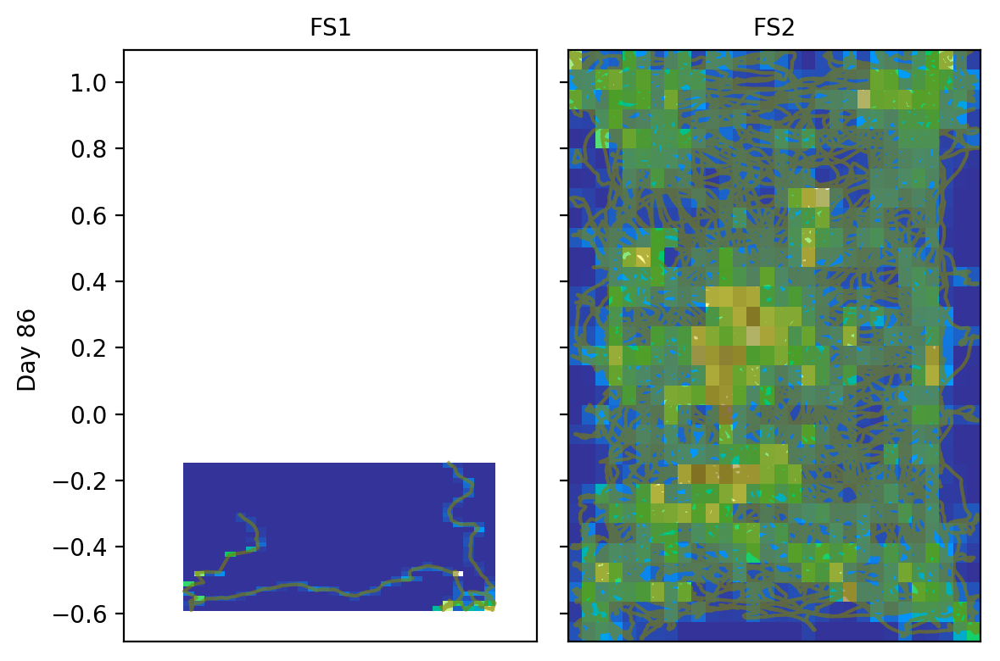

21821


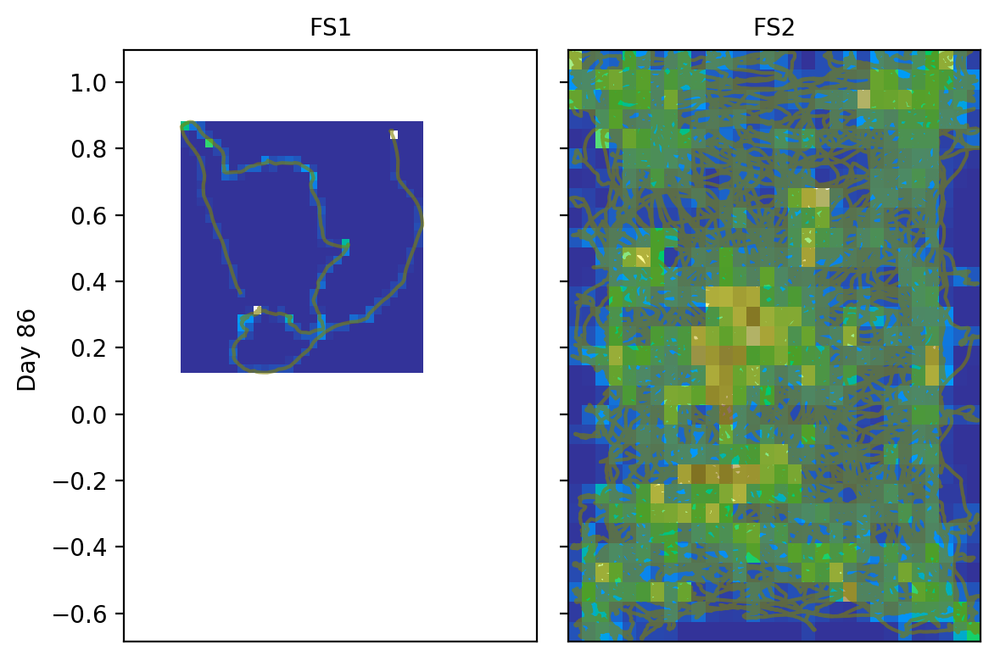

21146


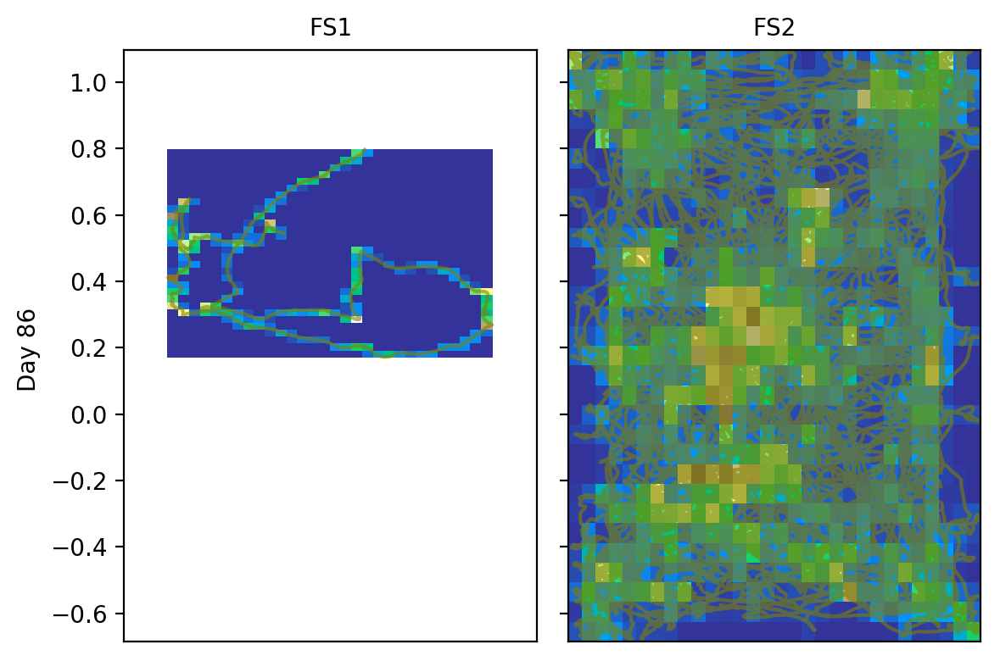

21109


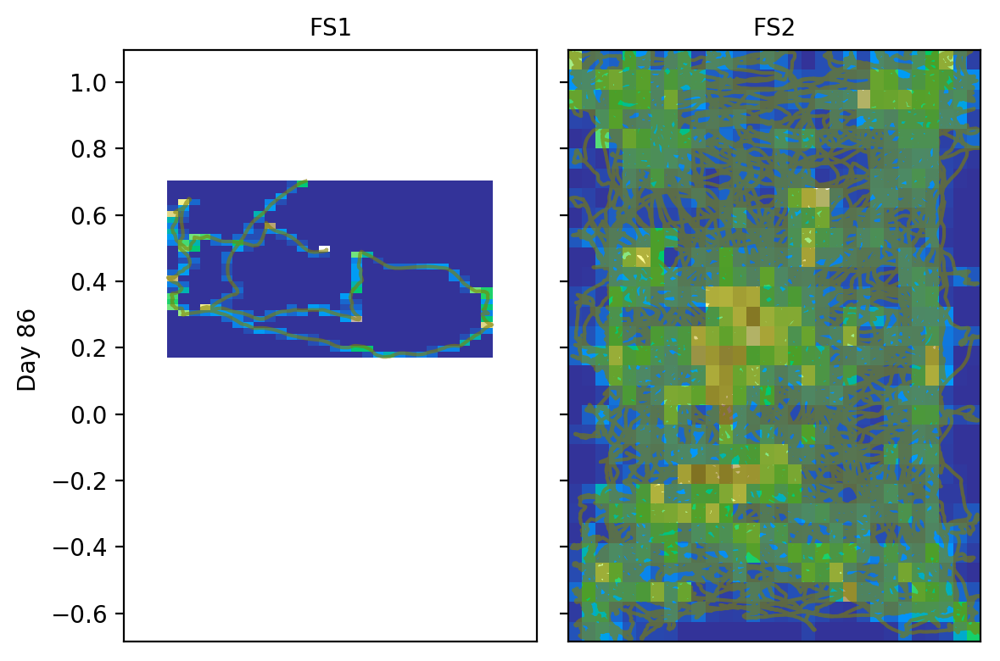

19184


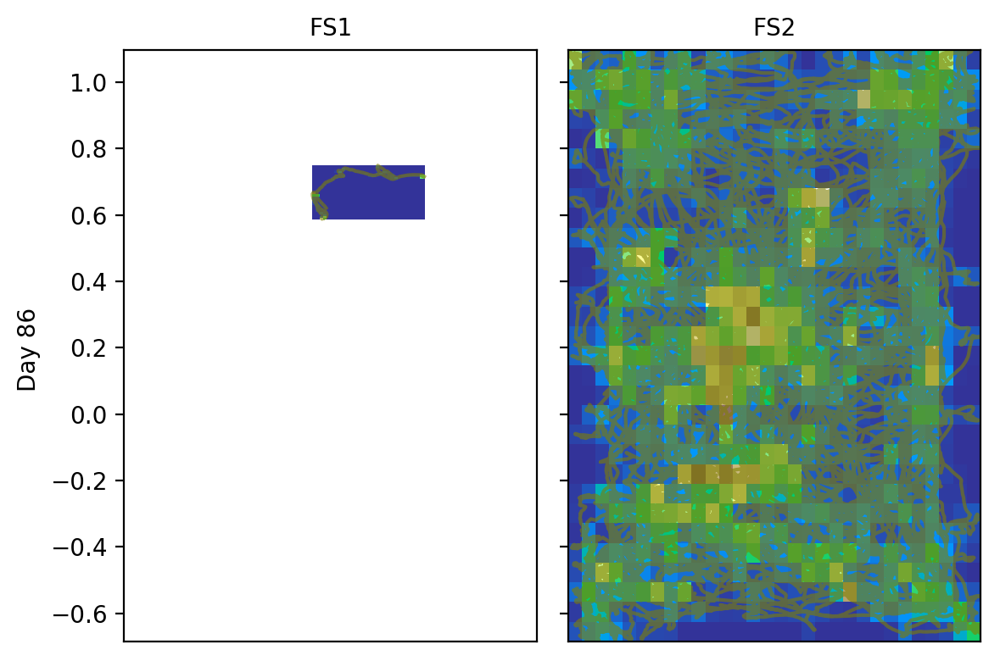

18875


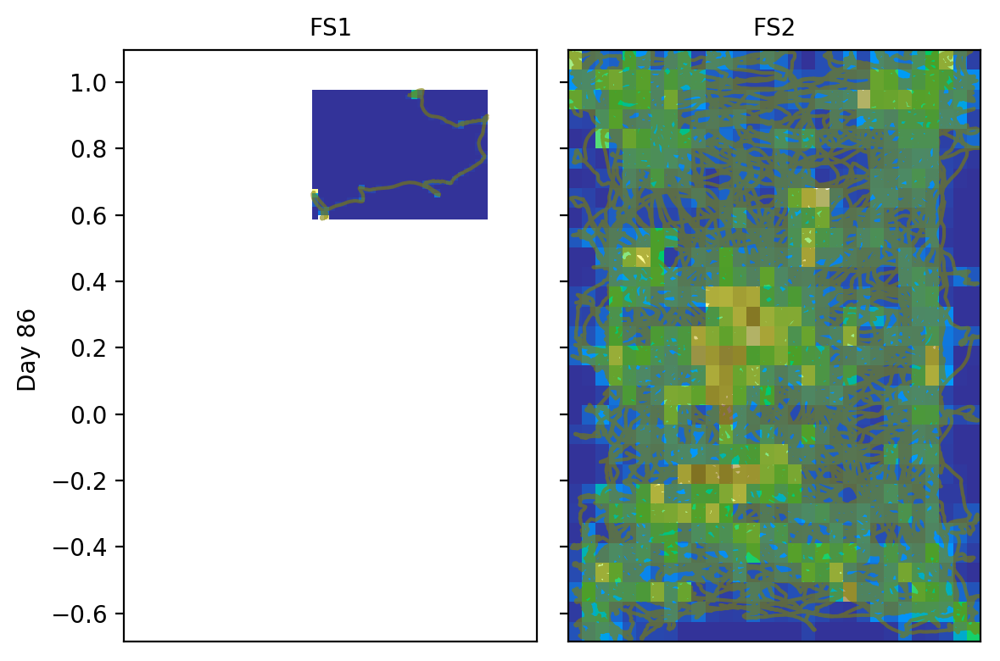

18718


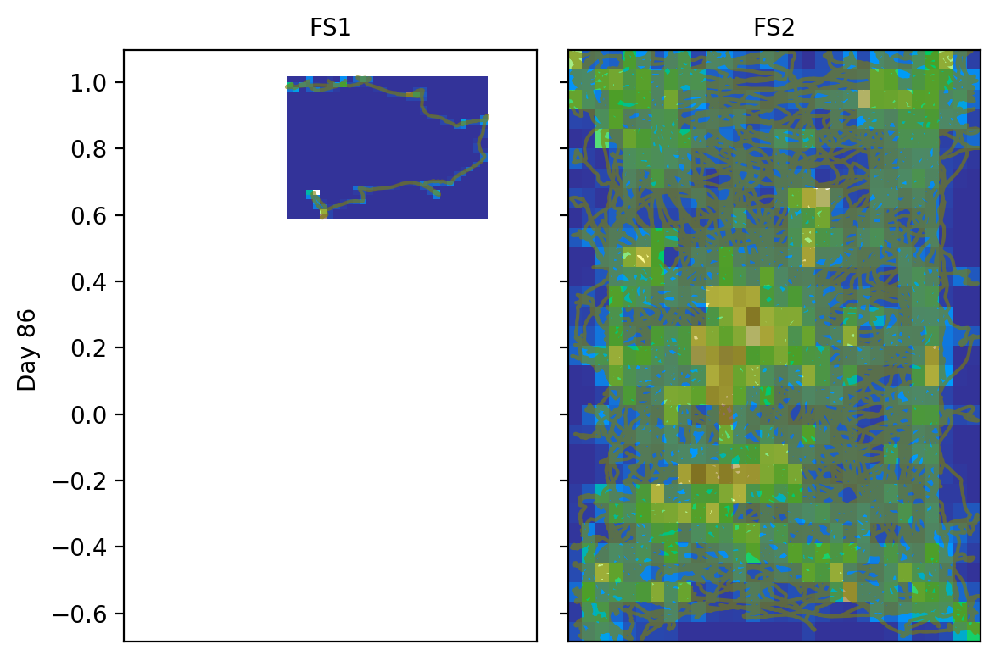

18671


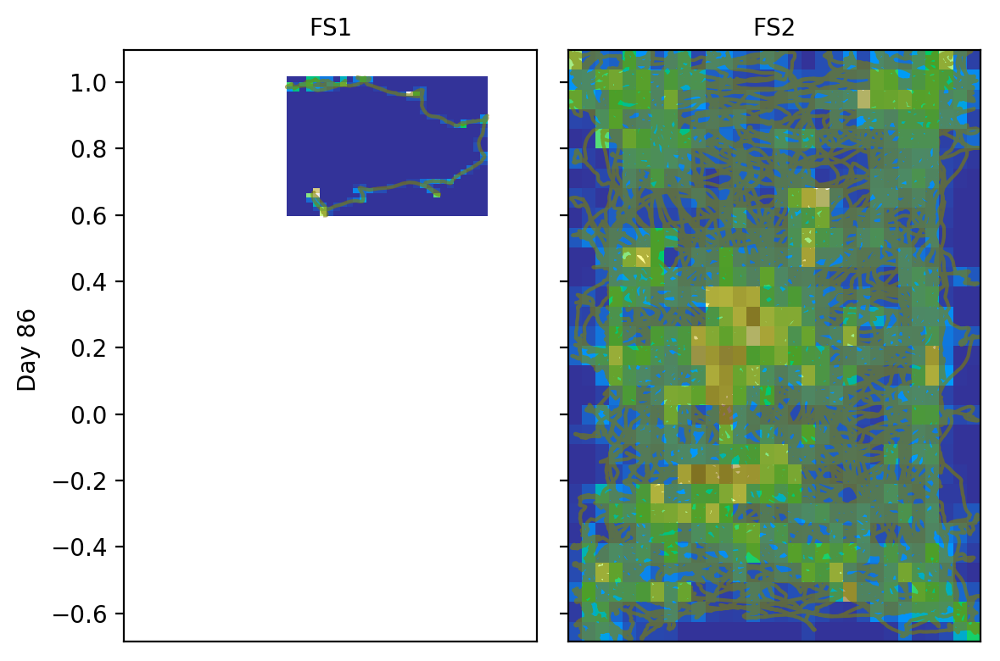

18434


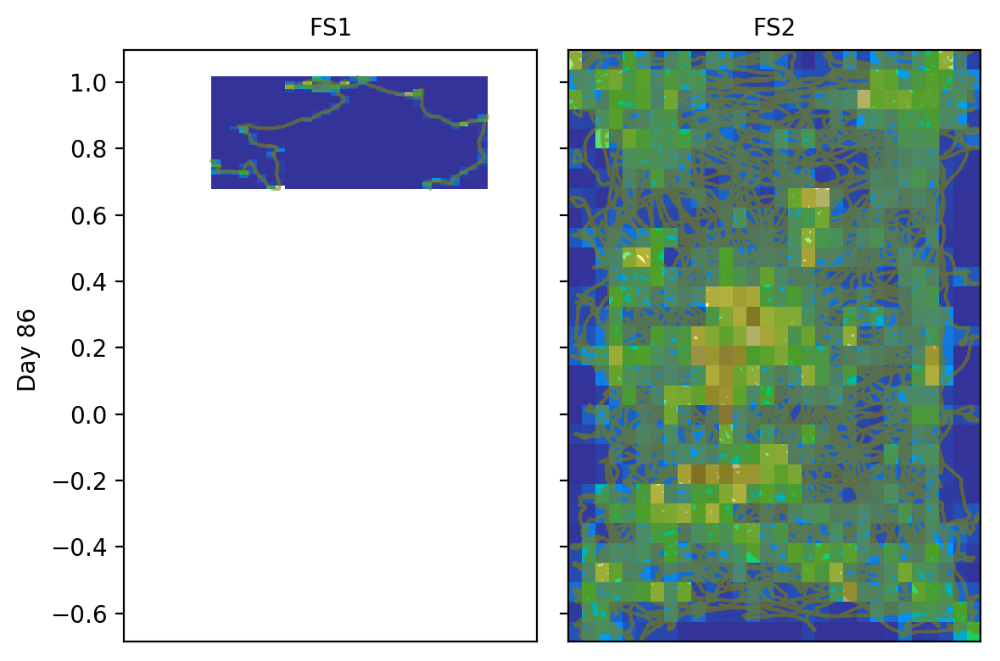

16268


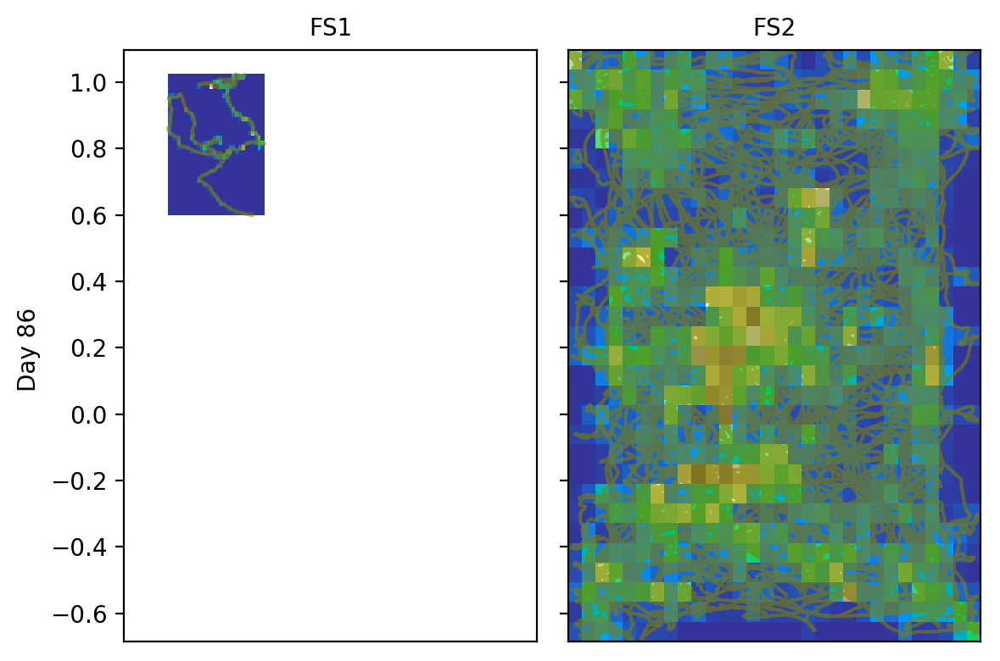

16161


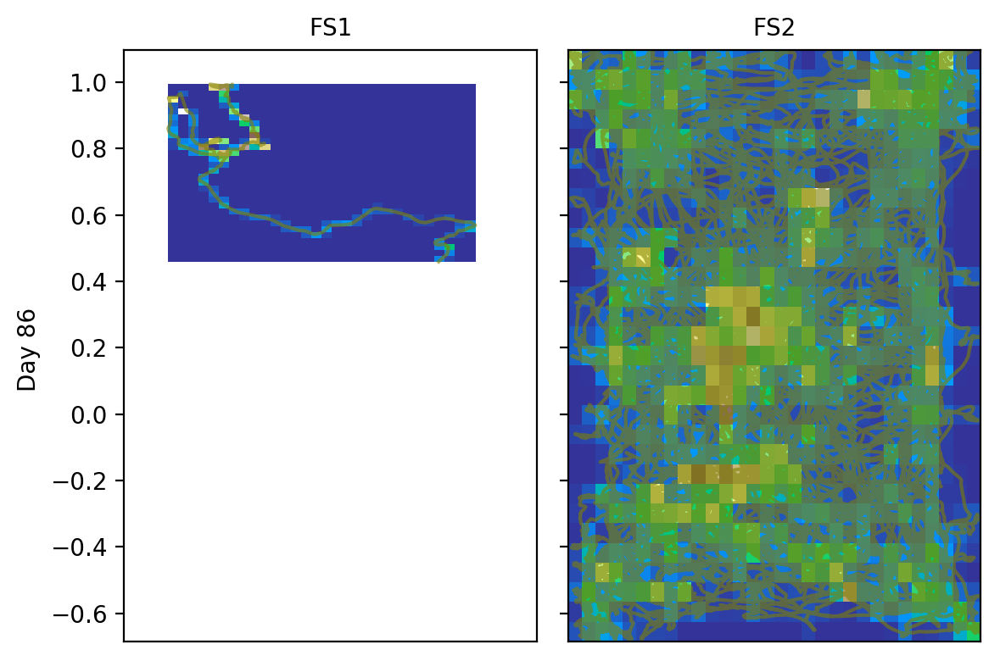

15942


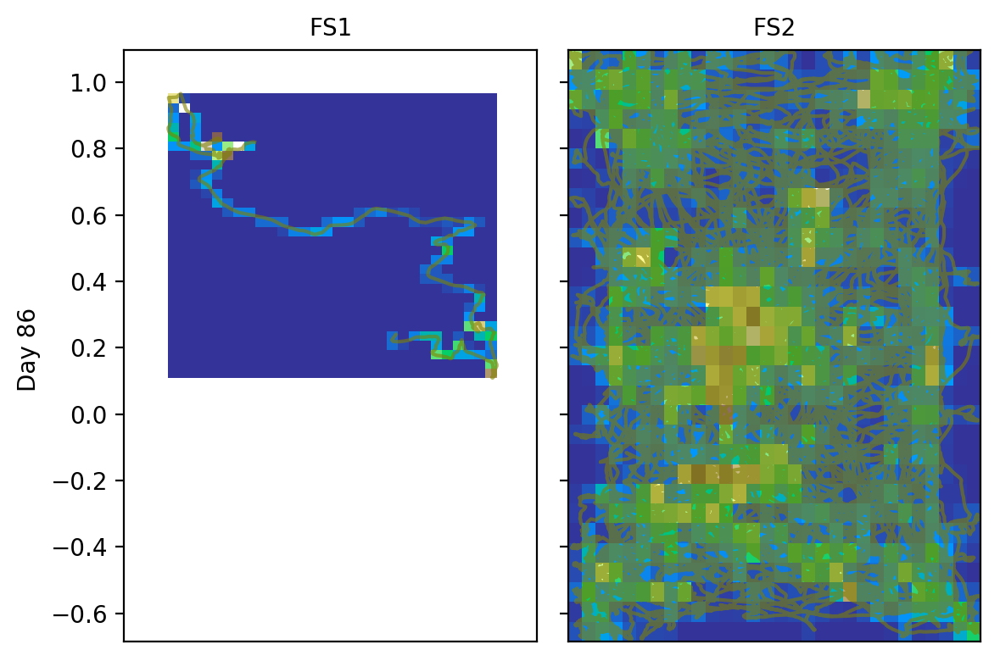

14805


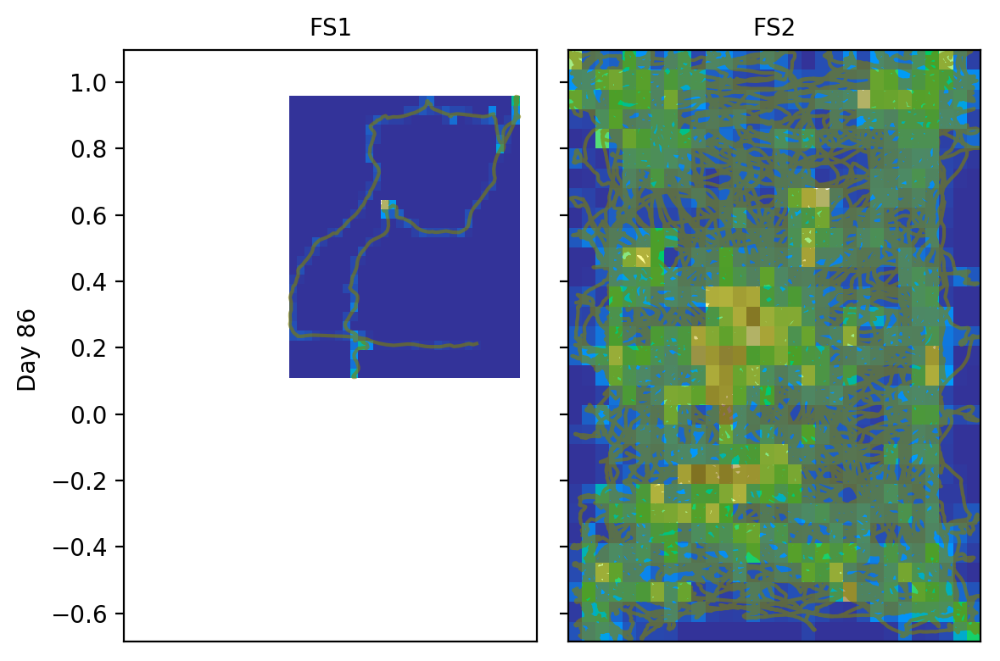

14599


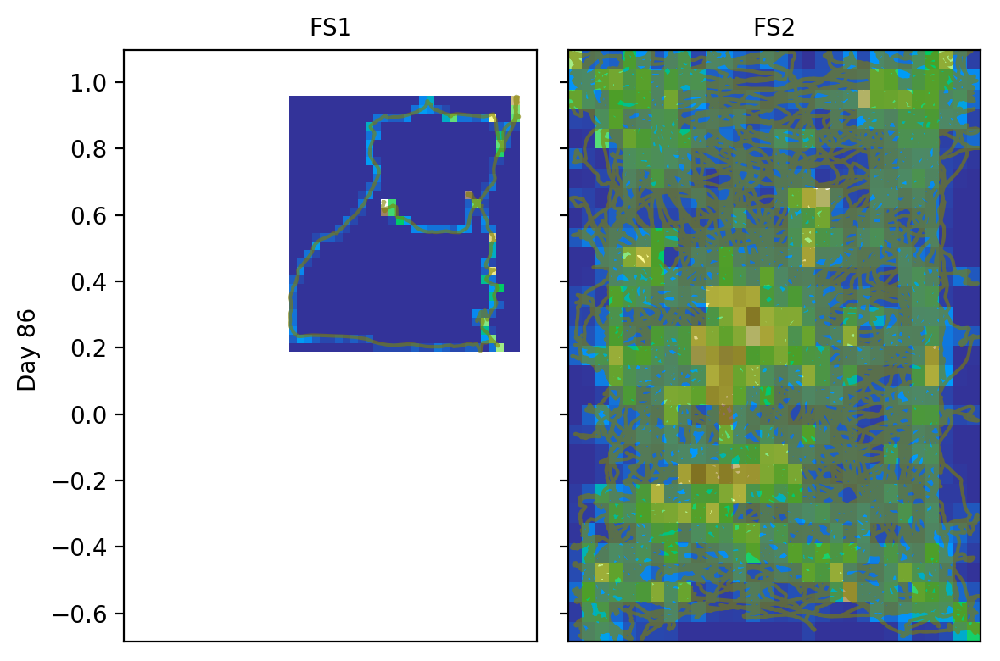

14252


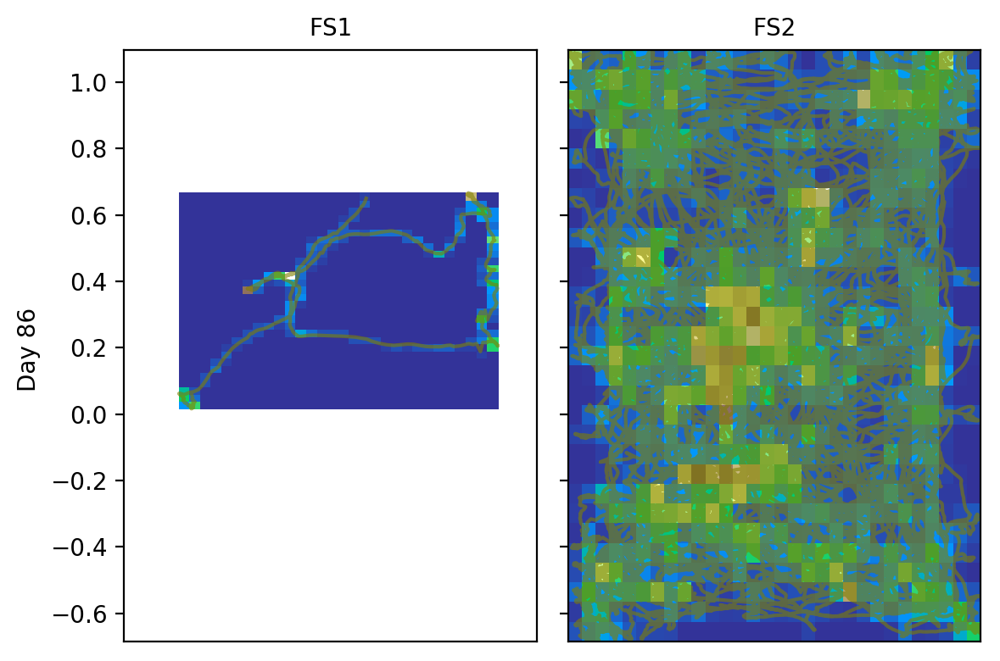

14164


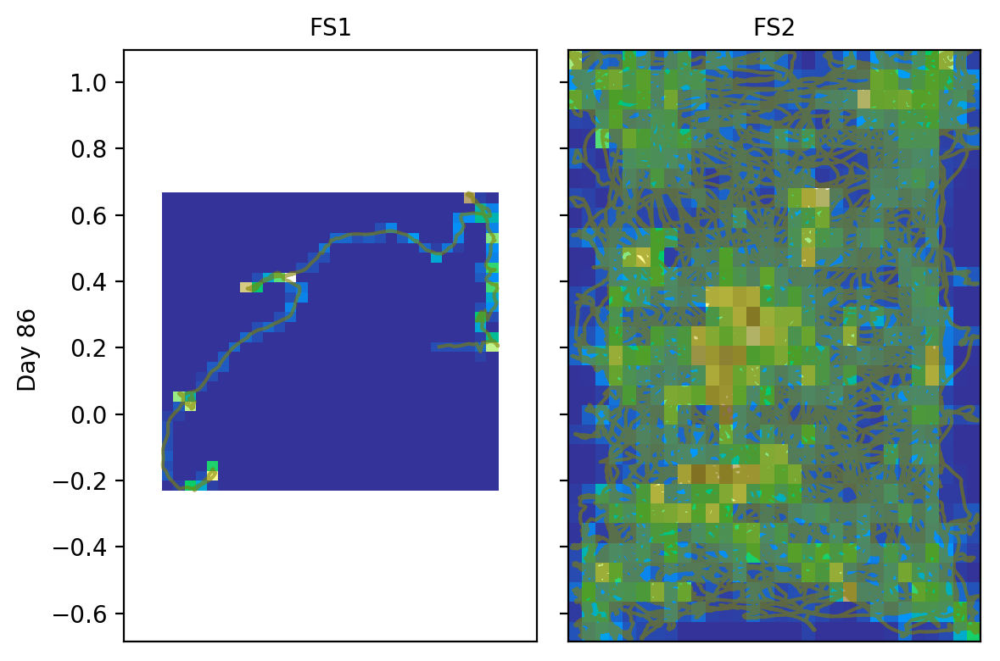

14070


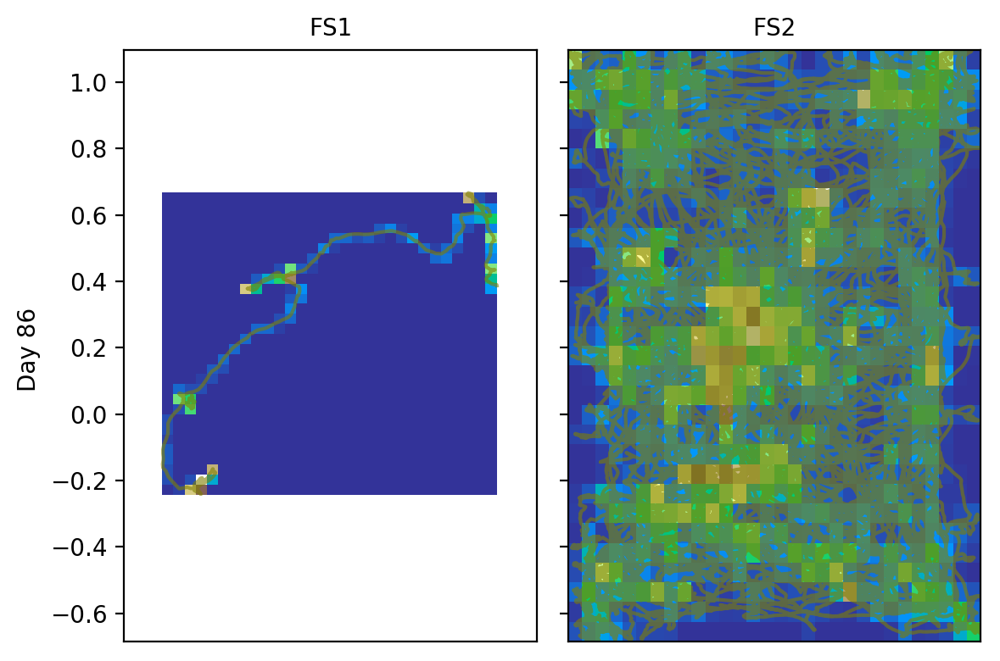

12623


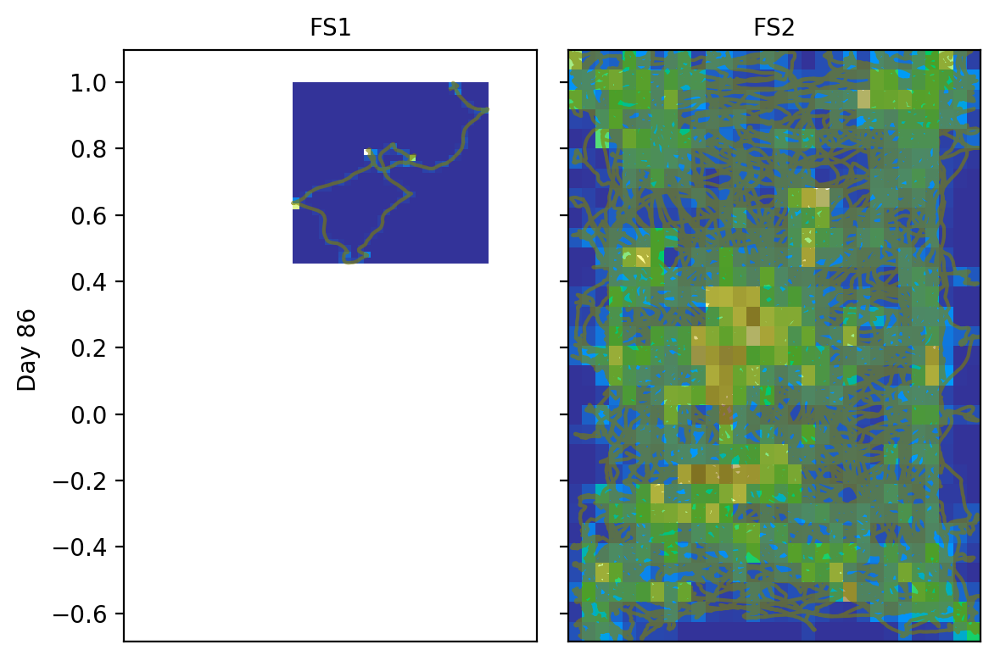

12553


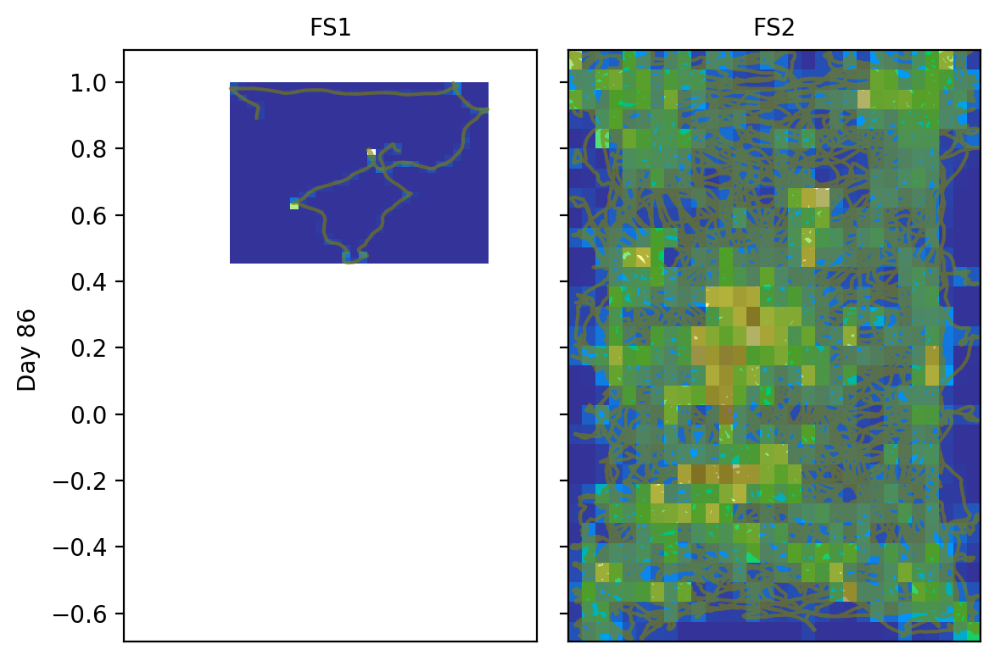

12514


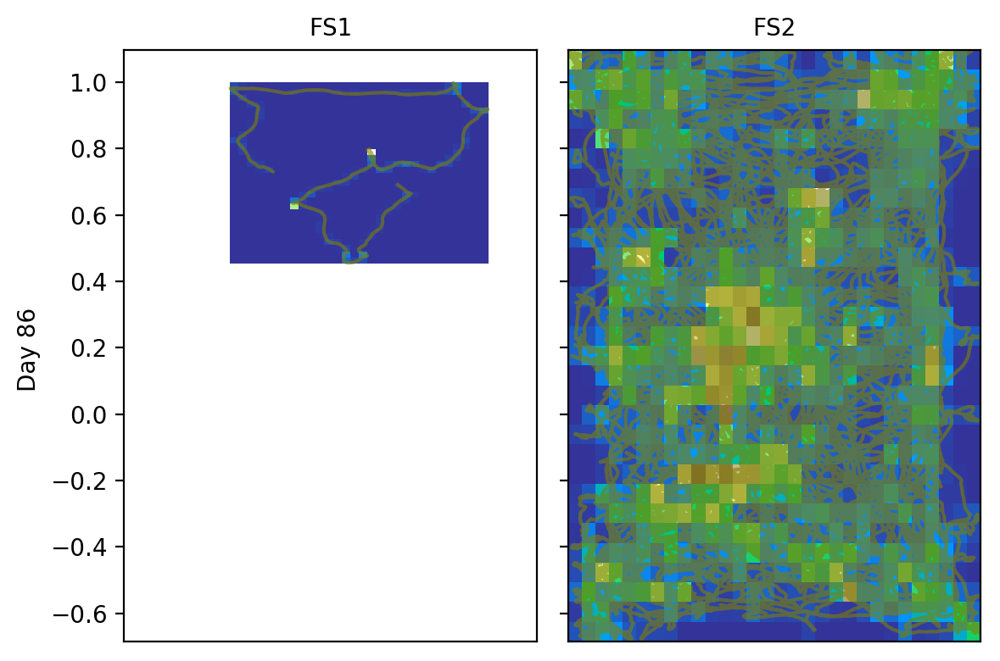

12168


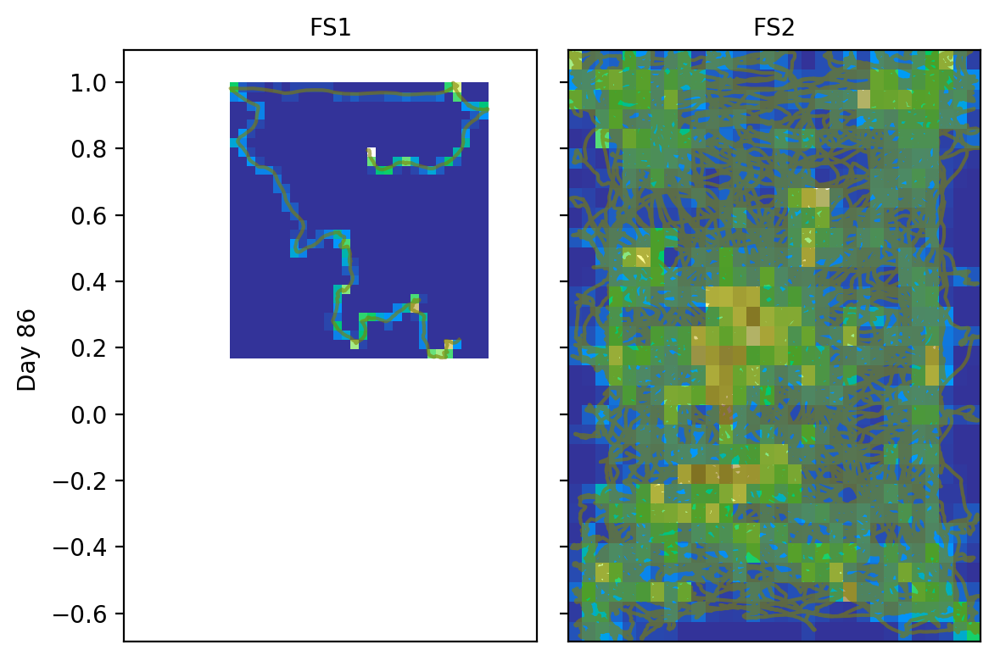

11733


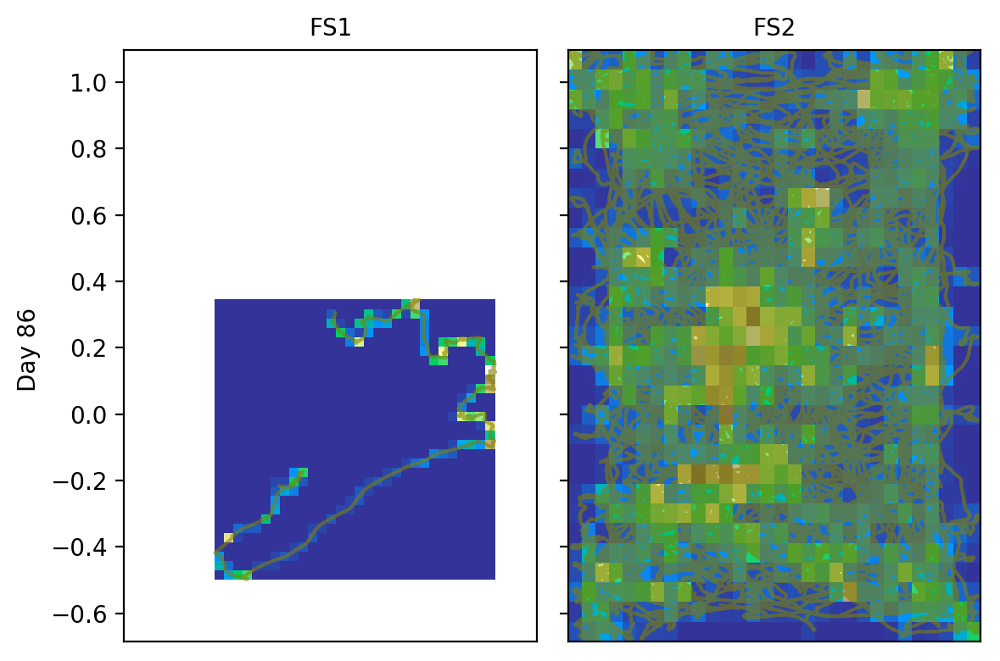

11537


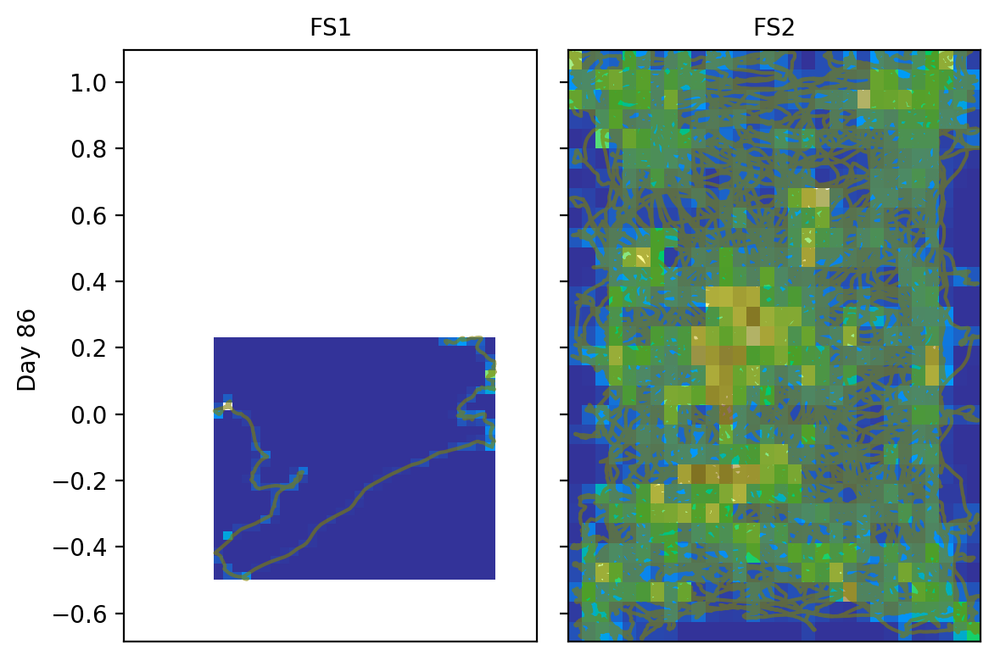

9390


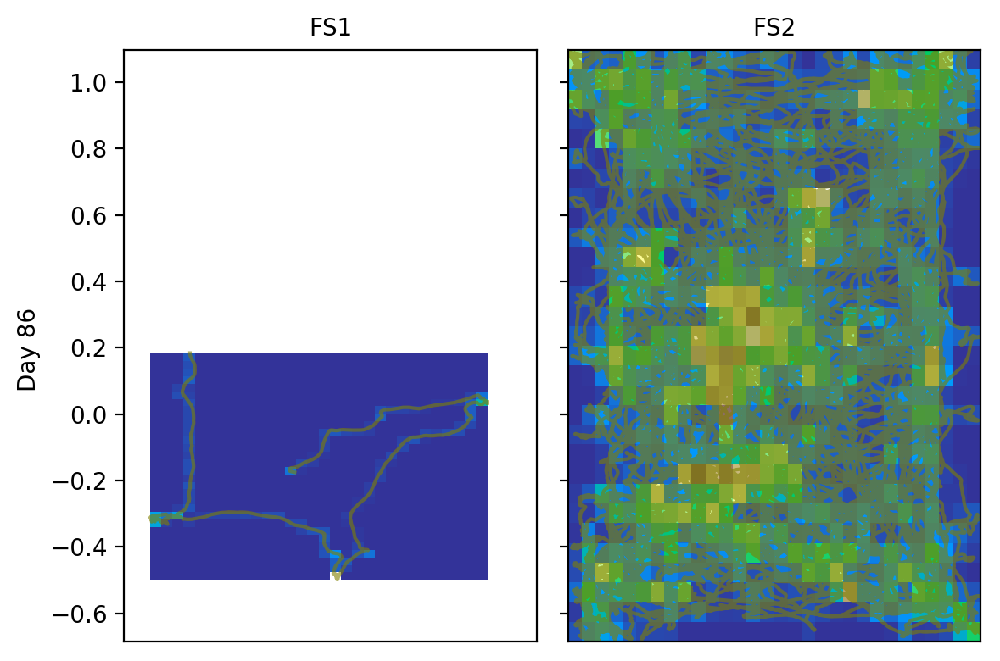

9172


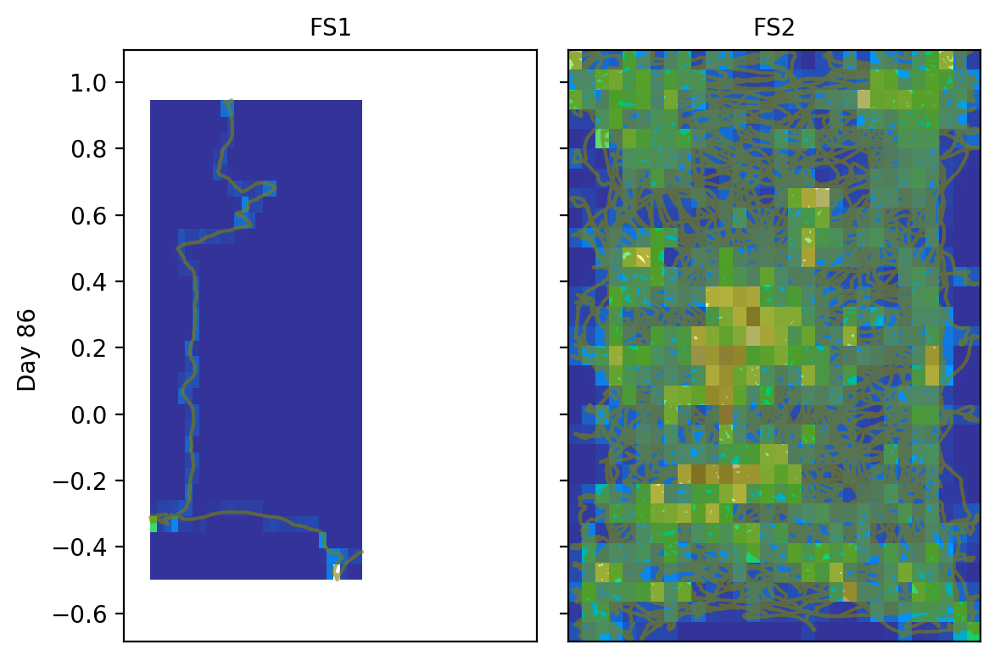

8372


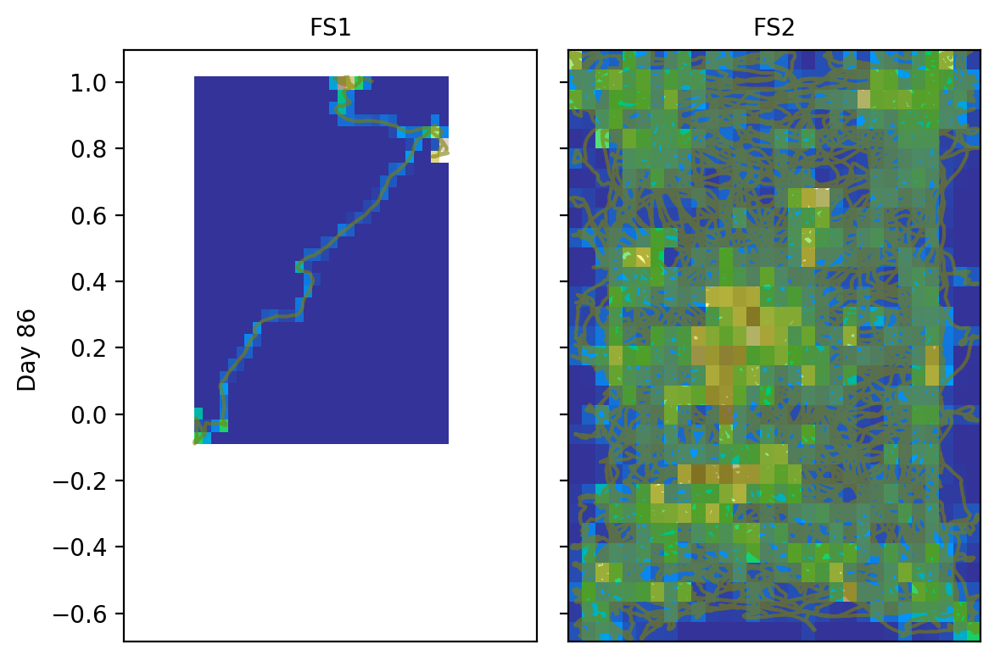

7898


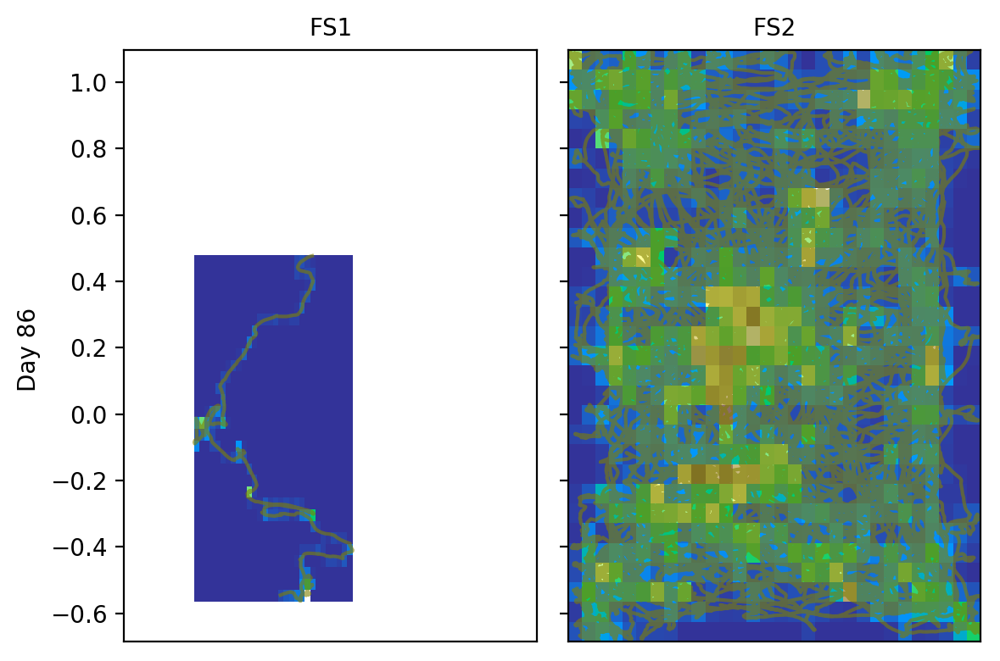

7505


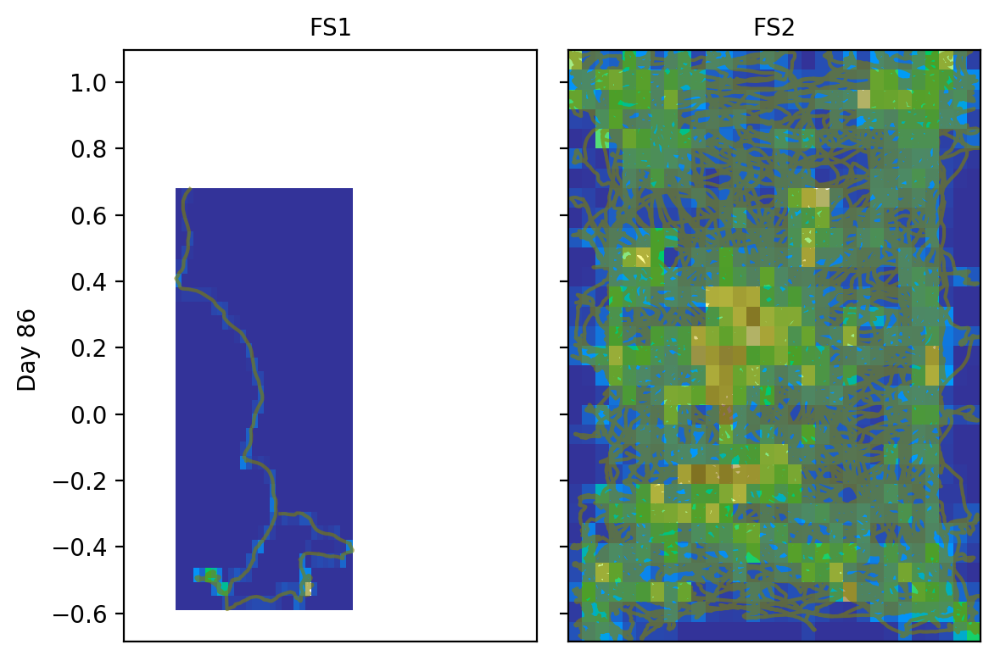

7412


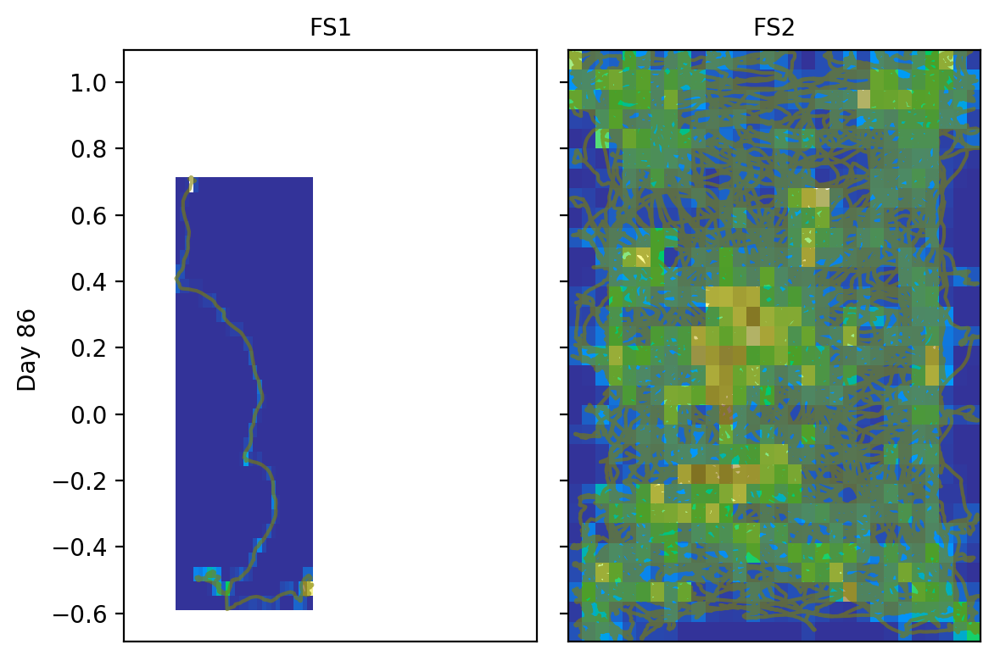

In [14]:
for i in index: 
    print (i)
    rotation_correction(Day86_fs1[i-650:i],Day86_fs2,86)

### Add beacons on each figure... 
scatter plot...
Plot last 1.5 seconds --- different 


### Now extract velocity: 
    
    But would it be 2d or 3d velocity.. 

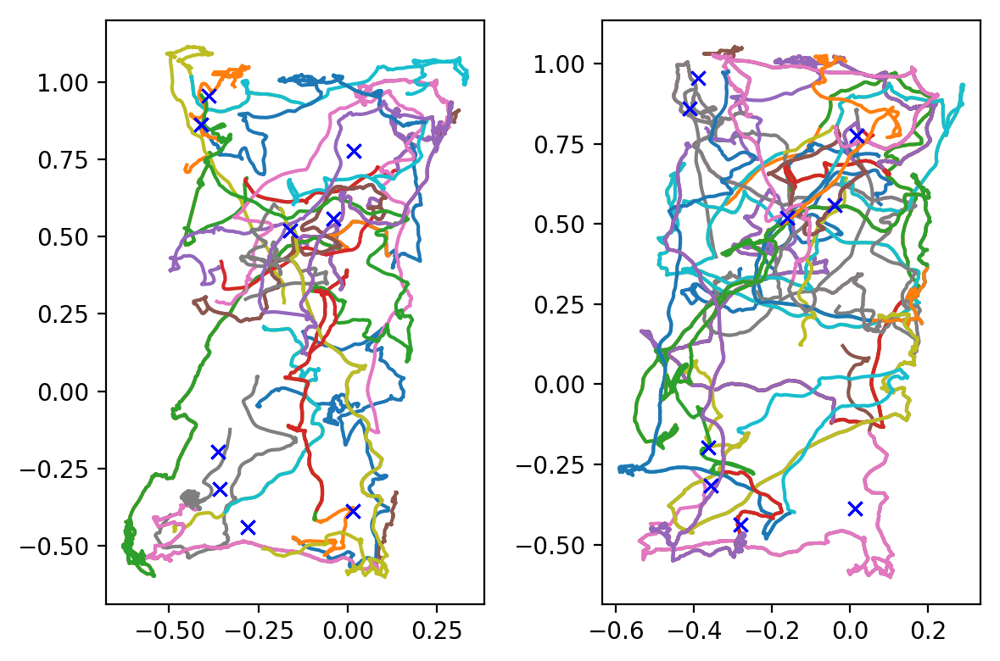

In [22]:
fig,ax = plt.subplots(1,2)

for i in index: 
    ax[0].plot(Day86_fs1[1][((i+1)*2)-650:((i+1)*2)],Day86_fs1[3][((i+1)*2)-650:((i+1)*2)])
    #print(i)
    #ax[1].plot(Day86_fs1[2][(i*2)-650:(i*2)])
    
    ax[1].plot(Day86_fs1[1][((i))-650:((i))],Day86_fs1[3][((i))-650:((i))])
    
def draw_beacons (Day_fs1,Day_fs2,day,beacon,beacon2):
    correctionx=-0.18037286
    correctiony=+0.20697327
    beaconx = beacon[4]+correctionx
    beacony = beacon[5]+correctiony
    ax[0].plot(beaconx,beacony,'bx',.15,linewidth=4)
    ax[1].plot(beaconx,beacony,'bx',.15,linewidth=4)
    
draw_beacons(Day86_fs1,Day86_fs2,86,beacon,beacon2)

fig.dpi=200
plt.tight_layout()
plt.show()



## Looks like 2 different ones. one visible and one not, but I think the i is off

### Drawing XY map and also the Z map to look at the height of the rat during beacon reaches. 

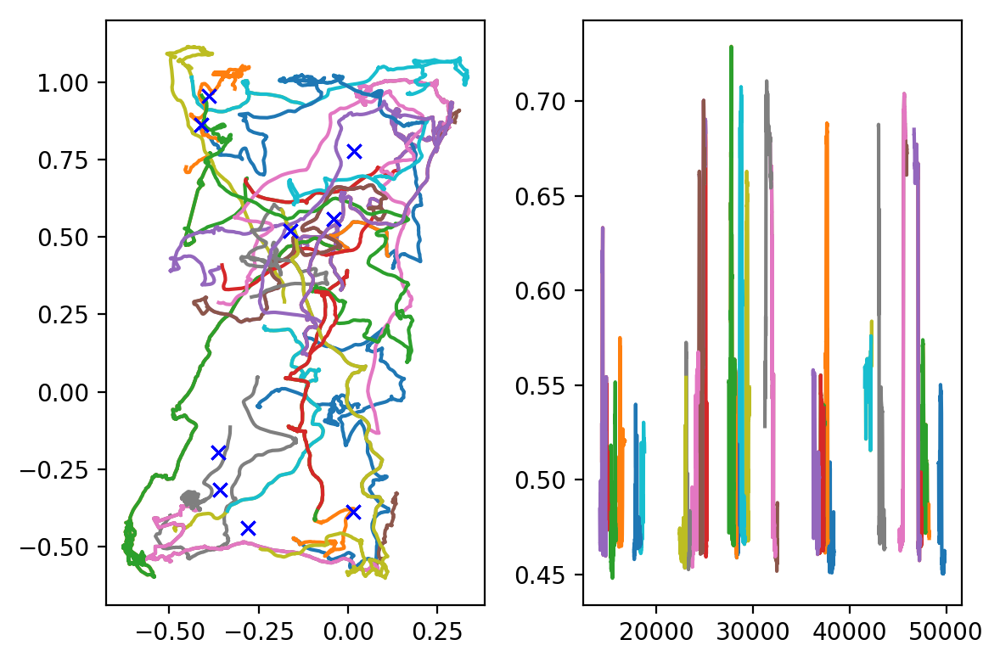

In [36]:
fig,ax = plt.subplots(1,2)

for i in index: 
    ax[0].plot(Day86_fs1[1][((i)*2)-650:((i)*2)],Day86_fs1[3][(i*2)-650:(i*2)])
    
    ax[1].plot(Day86_fs1[2][(i*2)-650:(i*2)])
    
def draw_beacons (Day_fs1,Day_fs2,day,beacon,beacon2):
    correctionx=-0.18037286
    correctiony=+0.20697327
    alpha = (5) * np.pi / 180
    Day_fs1x = Day_fs1[1] * np.cos(alpha) - Day_fs1[3] * np.sin(alpha)
    Day_fs1y = Day_fs1[1] * np.sin(alpha) + Day_fs1[3] * np.cos(alpha)
    Day_fs2x = Day_fs2[1] * np.cos(alpha) - Day_fs2[3] * np.sin(alpha)
    Day_fs2y = Day_fs2[1] * np.sin(alpha) + Day_fs2[3] * np.cos(alpha)
    entryx = beacon[1] * np.cos(alpha) - beacon[3] * np.sin(alpha)
    entryy = beacon[1] * np.sin(alpha) + beacon[3] * np.cos(alpha)
    entry2x = beacon2[1] * np.cos(alpha) - beacon2[3] * np.sin(alpha)
    entry2y = beacon2[1] * np.sin(alpha) + beacon2[3] * np.cos(alpha)
    beaconx = beacon[4]+correctionx
    beacony = beacon[5]+correctiony
    beacon2x = beacon2[4]+correctionx
    beacon2y = beacon2[5]+correctiony
    ax[0].plot(beaconx,beacony,'bx',.15,linewidth=4)
draw_beacons(Day86_fs1,Day86_fs2,86,beacon,beacon2)

fig.dpi=200
plt.tight_layout()
plt.show()

## How to graph every other? 

In [65]:
my_list = []
my_list = [i for i in my_list if i % 2]
lol = [] 
print(len(index))

35


# This graphs every other beacon - I.e. odd and even

In [79]:
times= index.tolist()
times.index(24017)

2

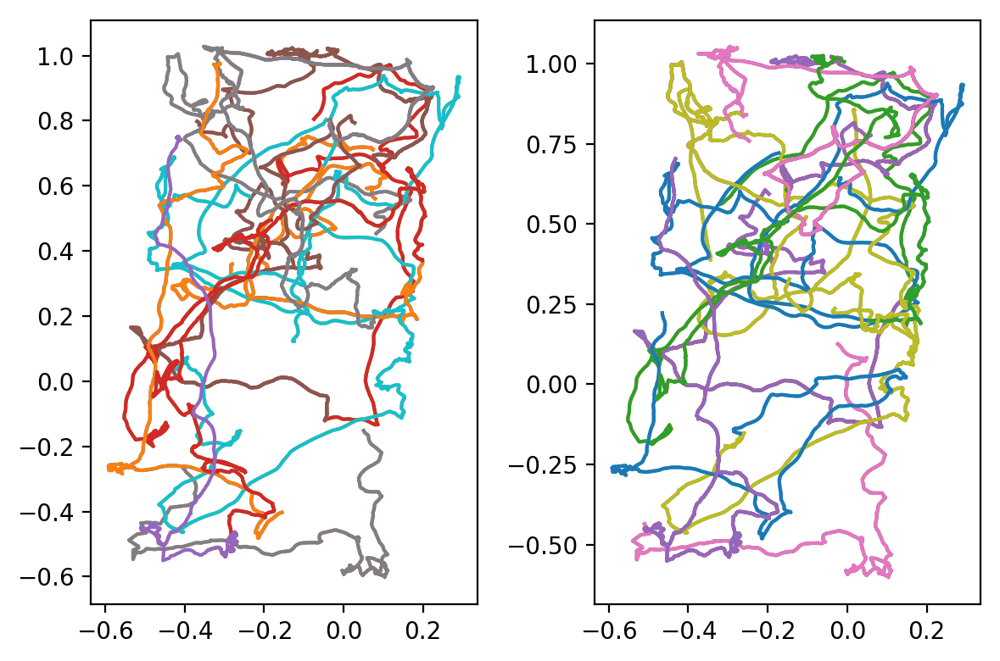

17
18


[24118,
 23735,
 22971,
 21821,
 21109,
 18875,
 18671,
 16268,
 15942,
 14599,
 14164,
 12623,
 12514,
 11733,
 9390,
 8372,
 7505]

In [99]:
fig,ax = plt.subplots(1,2)
lol = [] 
my_evenlist = []
my_oddlist = []
for i in times: 
    
    if (times.index(i)+1) % 2:
        my_oddlist.append(i)
    
    for o in my_oddlist:
    
        ratxodd = pd.DataFrame(np.array(Day86_fs1[1][(o)-650:(o)]))
        ratyodd = pd.DataFrame(np.array(Day86_fs1[3][(o)-650:(o)]))
    
    #This then only plots one less...
    if (times.index(i)) % 2:
        my_evenlist.append(i)
    
    for e in my_evenlist:
        
        ratxeven = Day86_fs1[1][(e+1)-650:(e+1)]
        ratyeven = Day86_fs1[3][(e+1)-650:(e+1)]
    
    ax[0].plot(ratxodd,ratyodd)
    ax[1].plot(ratxeven,ratyeven)
    
   
def draw_beacons (Day_fs1,Day_fs2,day,beacon,beacon2):
    correctionx=-0.18037286
    correctiony=+0.20697327
    beaconx = beacon[4]+correctionx
    beacony = beacon[5]+correctiony
    ax[0].plot(beaconx,beacony,'bx',.15,linewidth=4)
    ax[1].plot(beaconx,beacony,'bx',.15,linewidth=4)
    
#draw_beacons(Day86_fs1,Day86_fs2,86,beacon,beacon2)
    
#draw_beacons(Day86_fs1/2,Day86_fs2/2,86,beacon,beacon2)

fig.dpi=200
plt.tight_layout()
plt.show()
print(len(my_evenlist))
print(len(my_oddlist))
my_evenlist

### CONCLUSION: Often the animal gets 2 at a time - hence the trajectories are very simliar on many parts perhaps?

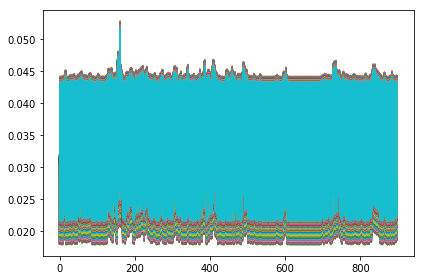

2.075042097592262

In [102]:
def calculateDistance(x,y):
    travel=0
    for i in range(len(y)-1):
        dist = math.sqrt((x[0+i] - x[1+i])**2 + (y[0+i] - y[1+i])**2)
        travel+=dist
    
    return travel

def calculateSpeed(x,y,time):
    travel=0
    speed=[]
    for i in range(len(y)-1):
        dist = math.sqrt((x[0+i] - x[1+i])**2 + (y[0+i] - y[1+i])**2)/time
        speed.append(dist)
        
    plt.plot(speed)   
    fig.dpi=200
    plt.tight_layout()
    plt.show()
    return 
    
calculateSpeed(Day86_fs1[0].values,Day86_fs1[1][100:1000].values,Day86_fs1[2][100:1000].values)

calculateDistance(Day86_fs1[1][100:1000].values,Day86_fs1[2][100:1000].values)


### TODO: 
    divide by 2 to only see visibvle trial and inivisible ones...  - Done Above --- YES 
    Also make a rearing plot ehre I set height above rering and then plot with X nad y but only when animal is rearing - Done in transfomrations... - cut of for state seperation would be .625  

## Below: Need to get times when the rat is below the threshold... then use the times index to plot x and y 

<bound method Series.keys of 0         0.465863
1         0.466494
2         0.463602
3         0.461981
4         0.463153
5         0.462807
6         0.462911
7         0.462839
8         0.462773
9         0.463402
10        0.462614
11        0.461675
12        0.460956
13        0.459977
14        0.459566
15        0.461277
16        0.463143
17        0.463233
18        0.462822
19        0.462135
20        0.461102
21        0.460682
22        0.461334
23        0.462574
24        0.463221
25        0.463306
26        0.463008
27        0.463705
28        0.463930
29        0.463125
            ...   
107945    0.583314
107946    0.583715
107947    0.583309
107948    0.584126
107949    0.583810
107950    0.584555
107951    0.583209
107952    0.581507
107953    0.584396
107954    0.582958
107955    0.581406
107956    0.580500
107957    0.581335
107958    0.581539
107959    0.581915
107960    0.580225
107961    0.580398
107962    0.580709
107963    0.580300
107964    0.580595
10

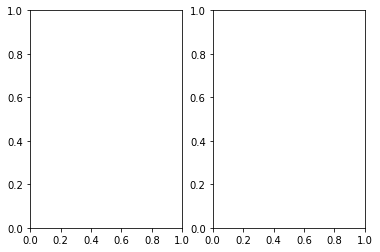

In [114]:
fig,ax = plt.subplots(1,2)
ratxhigh =[]
for i in Day86_fs1[2]:
    if i >=.625:
        ratxhigh = Day86_fs1[2].keys
        
print(ratxhigh)
    #ax[0].plot(ratxodd,ratyodd)
    #ax[1].plot(ratxeven,ratyeven)
    #plt.plot(Day86_fs1[1][i],Day86_fs1[2][i])
        


In [106]:
Day86_fs1[2][100:1000].keys

<bound method Series.keys of 100    0.456335
101    0.456847
102    0.457147
103    0.456830
104    0.457025
105    0.457293
106    0.457614
107    0.457313
108    0.457551
109    0.457603
110    0.457906
111    0.458211
112    0.458253
113    0.458123
114    0.457432
115    0.456471
116    0.457005
117    0.458996
118    0.459324
119    0.457790
120    0.456281
121    0.455602
122    0.455696
123    0.456793
124    0.457696
125    0.458118
126    0.457273
127    0.456135
128    0.455803
129    0.456672
         ...   
970    0.461389
971    0.459963
972    0.459706
973    0.461240
974    0.461715
975    0.460657
976    0.460361
977    0.460114
978    0.460280
979    0.461158
980    0.462137
981    0.462254
982    0.460911
983    0.459192
984    0.459269
985    0.459124
986    0.459633
987    0.458896
988    0.457651
989    0.456090
990    0.456391
991    0.458055
992    0.460550
993    0.461041
994    0.461054
995    0.459608
996    0.460808
997    0.461590
998    0.462174
999    0.46

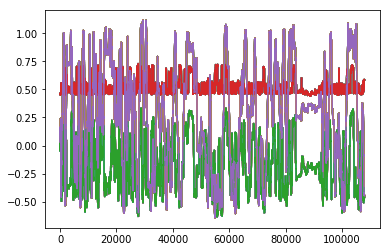

In [91]:
for i in index: 
    plt.plot(Day86_fs1[1])
    plt.plot(Day86_fs1[2])
    plt.plot(Day86_fs1[3])
    #plt.plot(Day86_fs1[4])
    

### The simple way to do it without a function: 